In [1]:
#Utils
import os
import pandas as pd
import numpy as np
from scipy.stats import wilcoxon
from itertools import combinations
#Plotting
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import os
import torch
from sera_opt_proto import phi, sera_errors_pt
%load_ext autoreload
%autoreload 2

In [2]:
model_list = ['kNN', 'SVR', 'MR','XGBoost',"DNN","GCN"] #
selection_metric = ["MAE","MSE","SERA"]

# Load Data

In [118]:
test_performance=None
test_predictions=None

for target_folder in os.listdir("regression_results/"):
    for model_folder in os.listdir(f"regression_results/{target_folder}/"):
        if test_performance is None:
            test_performance = pd.read_csv(os.path.join(f"regression_results/{target_folder}/{model_folder}/", 'performance_test.csv'))
            test_predictions = pd.read_csv(os.path.join(f"regression_results/{target_folder}/{model_folder}/", 'predictions_test.csv'))
        else:
            test_performance_ml = pd.read_csv(os.path.join(f"regression_results/{target_folder}/{model_folder}/", 'performance_test.csv'))
            test_predictions_ml = pd.read_csv(os.path.join(f"regression_results/{target_folder}/{model_folder}/", 'predictions_test.csv'))
            test_performance = pd.concat([test_performance, test_performance_ml])
            test_predictions = pd.concat([test_predictions, test_predictions_ml])

test_performance=test_performance.reset_index()
test_predictions=test_predictions.reset_index()

test_predictions.loc[test_predictions["algorithm"]=="XGBoost","algorithm"]="XGB"





## Functions

In [119]:


def table_error(df,metric):
   
    models=pd.DataFrame()
   
    for classe in np.unique(df["Target ID"].values):
        
        data =df.loc[(df['Metric'] == metric) & (df["Target ID"]==classe)].reset_index()
    
      
        var=data.groupby(["Metric","Algorithm","Selection Metric"])["Value"].std().reset_index()
       
        data=data.groupby(["Metric","Algorithm","Selection Metric"])["Value"].mean().reset_index()
        
        data["STD"]=[str(val).ljust(4, "0") for val in round(var["Value"],2)]
        data["Value"]=[str(val).ljust(5, "0") for val in round(data["Value"],3)]

        data["Value"]="$"+data["Value"]+"\pm"+data["STD"]+"$"
        data["Target ID"]=classe

        
        data["Algorithm_opt"]="$"+data["Algorithm"]+"_{"+data["Selection Metric"]+"}$"
       
    
        data=data[["Target ID","Algorithm_opt","Value"]]
     
        if models.empty:
            models=pd.DataFrame(data)
        else:
            models=pd.concat([models,pd.DataFrame(data)])

   # table=pd.DataFrame(models.pivot(index='Algorithm_opt', columns='Metric').reset_index())
    table=pd.DataFrame(models.pivot(index='Algorithm_opt', columns='Target ID').reset_index())
    
    print(table.to_string(index=False))
    table.to_csv(f"{metric}_table.csv")




## REGULAR

In [120]:
import pandas as pd
import os
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from ml_utils import *
#from machine_learning_models import *
from fingerprints import *
from sklearn.model_selection import ShuffleSplit, KFold
#sys
import sys
import statistics as stats

db_path = './dataset/'
# Load actives dB
regression_db = pd.read_csv(os.path.join(db_path, f'chembl_30_IC50_10_tids_1000_CPDs.csv'))
# Regression Compound Targets
regression_tids = regression_db.chembl_tid.unique()[:10]

regression_db["Target ID"]=[text[6:] for text in regression_db["chembl_tid"]]
regression_db["pIC50"]=regression_db.loc[:,"pPot"]

In [106]:
regression=regression_db.loc[regression_db["chembl_tid"]=="CHEMBL262"]
regression["pIC50"]=[round(value,3) for value in regression["pIC50"].values]
regression.to_csv("regression.csv")


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\778124702.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  regression["pIC50"]=[round(value,3) for value in regression["pIC50"].values]


c:\Users\brend\Documents\CGN-SERA\SERA_venv\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\brend\Documents\CGN-SERA\SERA_venv\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\brend\Documents\CGN-SERA\SERA_venv\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\brend\Documents\CGN-SERA\SERA_venv\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figur

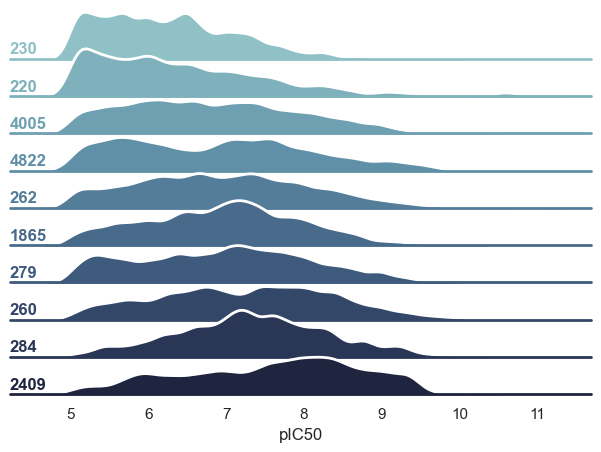

In [7]:

db=regression_db.drop(["nonstereo_aromatic_smiles","pPot","chembl_cid","chembl_tid"],axis=1)


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})


db_mean=db.groupby("Target ID").mean()
db_mean=db_mean.sort_values("pIC50")

db_iqr=db.groupby("Target ID").apply(stats.iqr)
db_iqr=db_iqr.sort_values()


# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(db, row="Target ID", hue="Target ID", row_order=db_mean.index,
                  hue_order=db_mean.index, aspect=15, height=.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "pIC50",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1)
g.map(sns.kdeplot, "pIC50", clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "pIC50")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)
plt.savefig("results_plots/density.png",dpi=300,bbox_inches="tight")

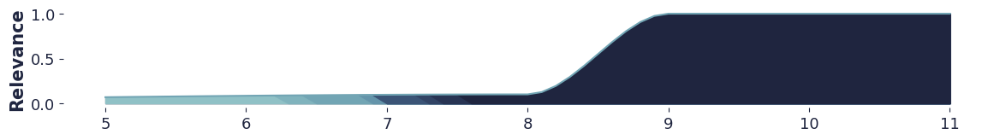

In [155]:
import matplotlib.gridspec as gridspec
##gs = gridspec.GridSpec(3, 1)
#ax1 = plt.subplot(gs[0, :])
fig, ax = plt.subplots(figsize=(14, 1.5))

ph8={"method":"extremes","npts": 3,"control_pts":[0,0,0,8,0.1,0,9,1,0]}
phi_labels=phi(pd.Series(np.arange(5,11.1,0.1)), phi_parms=ph8)


db_rel=pd.DataFrame({"pIC50": np.arange(5,11.1,0.1),
                     "Relevance8":phi_labels})
#print(db_rel.loc[db_rel["Relevance8"]>=0.09])

color=sns.cubehelix_palette(11,rot=-.25, light=0.7) #11
y8=db_rel.Relevance8
x=db_rel.pIC50

font = {
        'color':  color[10],#10
        'weight': 'bold',
        'size': 15,
        }


ax.set_ylabel('Relevance',fontdict=font)

ax.plot(x,y8,color=color[2])

ax.fill_between(x,y8,0,where=x>0,interpolate=True,color=color[10])


ax.fill_between(x,y8,0,where=x>0,interpolate=True,color=color[0])
i=1
for mean in db_mean.pIC50:
 
        ax.fill_between(x,y8,0,where=x>mean,interpolate=True,color=color[i])
        i+=1

#ax.get_xaxis().set_ticks([])
ax.tick_params(axis='y', colors= color[10],labelsize=13)
ax.tick_params(axis='x', colors= color[10],labelsize=13)

#plt.rcParams["font.weight"] = "bold"

plt.box(on=None)
plt.savefig("results_plots/relevance.png",dpi=300,bbox_inches="tight")
plt.show()


## Table Global Rank

In [123]:
table_error(test_performance,"MAE")

   Algorithm_opt          Value                                                                                                                                       
                            220            230            260            262            279            284           1865           2409           4005           4822
     $kNN_{MAE}$ $0.497\pm0.02$ $0.431\pm0.04$ $0.468\pm0.02$ $0.535\pm0.02$ $0.547\pm0.03$ $0.477\pm0.02$ $0.500\pm0.03$ $0.623\pm0.02$ $0.476\pm0.04$ $0.440\pm0.02$
     $kNN_{MSE}$ $0.505\pm0.03$ $0.436\pm0.03$ $0.469\pm0.02$ $0.535\pm0.02$ $0.562\pm0.03$ $0.480\pm0.03$ $0.500\pm0.03$ $0.623\pm0.02$ $0.476\pm0.04$ $0.437\pm0.02$
    $kNN_{SERA}$ $0.496\pm0.02$ $0.449\pm0.03$ $0.466\pm0.02$ $0.530\pm0.01$ $0.552\pm0.04$ $0.468\pm0.03$ $0.492\pm0.03$ $0.623\pm0.02$ $0.492\pm0.04$ $0.438\pm0.02$
     $kNN_{AFO}$ $0.497\pm0.04$ $0.435\pm0.04$ $0.459\pm0.02$ $0.521\pm0.02$ $0.549\pm0.04$ $0.471\pm0.03$ $0.489\pm0.03$ $0.616\pm0.02$ $0.467\pm0.04$ $0.439\pm0.02

In [122]:
table_error(test_performance,"MSE")

   Algorithm_opt          Value                                                                                                                                       
                            220            230            260            262            279            284           1865           2409           4005           4822
     $kNN_{MAE}$ $0.492\pm0.05$ $0.377\pm0.07$ $0.405\pm0.03$ $0.507\pm0.04$ $0.544\pm0.07$ $0.447\pm0.04$ $0.475\pm0.06$ $0.677\pm0.03$ $0.410\pm0.06$ $0.352\pm0.04$
     $kNN_{MSE}$ $0.492\pm0.05$ $0.377\pm0.07$ $0.403\pm0.03$ $0.507\pm0.04$ $0.557\pm0.08$ $0.452\pm0.06$ $0.475\pm0.06$ $0.677\pm0.03$ $0.410\pm0.06$ $0.347\pm0.04$
    $kNN_{SERA}$ $0.500\pm0.04$ $0.408\pm0.04$ $0.404\pm0.03$ $0.504\pm0.03$ $0.550\pm0.08$ $0.435\pm0.05$ $0.465\pm0.06$ $0.677\pm0.03$ $0.473\pm0.09$ $0.344\pm0.05$
     $kNN_{AFO}$ $0.477\pm0.06$ $0.368\pm0.08$ $0.385\pm0.03$ $0.483\pm0.04$ $0.535\pm0.08$ $0.437\pm0.06$ $0.466\pm0.07$ $0.666\pm0.03$ $0.398\pm0.07$ $0.350\pm0.03

In [121]:
table_error(test_performance,"SERA")

   Algorithm_opt          Value                                                                                                                                       
                            220            230            260            262            279            284           1865           2409           4005           4822
     $kNN_{MAE}$ $0.106\pm0.03$ $0.062\pm0.02$ $0.094\pm0.02$ $0.129\pm0.03$ $0.108\pm0.02$ $0.119\pm0.03$ $0.109\pm0.03$ $0.230\pm0.05$ $0.068\pm0.01$ $0.074\pm0.03$
     $kNN_{MSE}$ $0.110\pm0.03$ $0.061\pm0.02$ $0.095\pm0.02$ $0.132\pm0.03$ $0.114\pm0.02$ $0.121\pm0.03$ $0.109\pm0.03$ $0.230\pm0.05$ $0.068\pm0.01$ $0.074\pm0.02$
    $kNN_{SERA}$ $0.104\pm0.03$ $0.062\pm0.02$ $0.094\pm0.02$ $0.126\pm0.02$ $0.109\pm0.02$ $0.115\pm0.03$ $0.104\pm0.03$ $0.230\pm0.05$ $0.085\pm0.03$ $0.071\pm0.02$
     $kNN_{AFO}$ $0.105\pm0.03$ $0.061\pm0.02$ $0.092\pm0.02$ $0.124\pm0.03$ $0.108\pm0.02$ $0.116\pm0.03$ $0.110\pm0.03$ $0.223\pm0.05$ $0.065\pm0.01$ $0.074\pm0.03

## Mean of predictions

In [124]:
data=test_predictions

data_relevance=pd.DataFrame()
for alg in ["kNN","SVR","XGB","DNN","GCN"]:
    for opt in ['MAE',"MSE","SERA","AFO"]:
            for target in data["Target ID"].unique():
                for rel in ["Low", "Medium", "High"]:
                    if rel=="Low":
                        df=data.loc[(data["Target ID"]==target) & (data["true"]<8)  & (data["algorithm"]==alg) & (data["MetricOpt"]==opt)]
                    elif rel=="Medium":
                        df=data.loc[(data["Target ID"]==target) & (data["true"]>=8) & (data["true"]<9)  & (data["algorithm"]==alg) & (data["MetricOpt"]==opt)]
                    else:
                        df=data.loc[(data["Target ID"]==target) & (data["true"]>=9) & (data["algorithm"]==alg) & (data["MetricOpt"]==opt)]

                    error=((df["predicted"].astype("float").values)-(df["true"].astype("float").values))
                    
                    data_aux={ "Target ID":target[6:],
                            "Error": error,
                            "Algorithm_opt":"$"+alg+"_{"+opt+"}$",
                            #"pIC50":i,
                            "Algorithm":alg,
                            "Selection Metric": opt,
                            "Relevance":rel,
                                }
                    data_aux=pd.DataFrame(data_aux)
                # data_aux2=pd.DataFrame(data_aux2)
                    data_relevance=pd.concat([data_relevance,data_aux])
                

<Figure size 1920x1440 with 0 Axes>

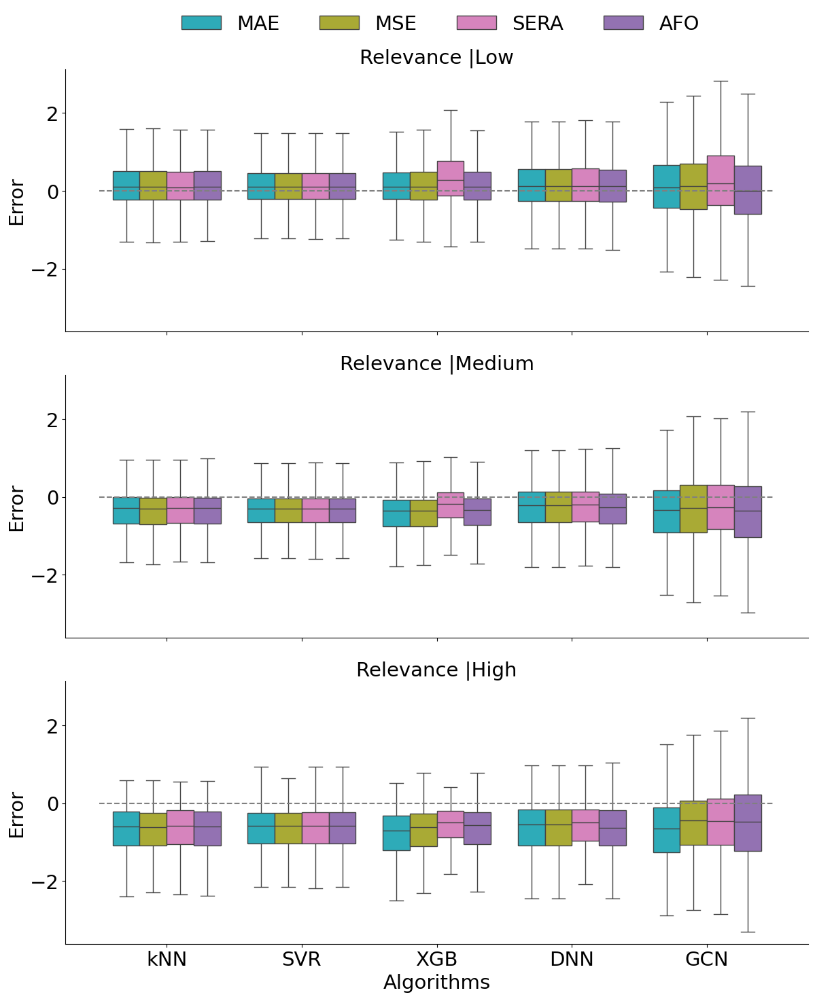

In [125]:
matplotlib.rcdefaults()
font = {'size': 21}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
ax = sns.catplot(x="Algorithm", y="Error",
                                hue="Selection Metric", hue_order=['MAE',"MSE","SERA","AFO"],palette=["tab:cyan","tab:olive","tab:pink","tab:purple"],
                                data=data_relevance,
                                kind="box",
                                #col="Relevance",
                                #col_order=[str(j) for j in db_mean.index.to_list()],
                                #col_wrap=5,
                                row="Relevance",
                                aspect=2.5,
                                showfliers = False,
                                legend=True,
                                #sharey="row"
                            
                            )
for target, axes in ax.axes_dict.items():
        axes.hlines(y = 0 , xmin = -0.5, xmax = 4.5,#12.7
                linestyles = ["dashed"], colors = ["gray"])
ax.set_titles(col_template="{col_name}", row_template="Relevance |{row_name}")
#ax.set_ylabels(f"Error (8<=Domain<9)")
ax.set_xlabels("Algorithms")
ax = sns.move_legend(ax, "upper center", bbox_to_anchor=(.46, 1.03), ncol=4, title=None, frameon=False)
plt.subplots_adjust(bottom=0.1)
plt.savefig(F"results_plots/errors_all.png", dpi=300,bbox_inches="tight")

<Figure size 1920x1440 with 0 Axes>

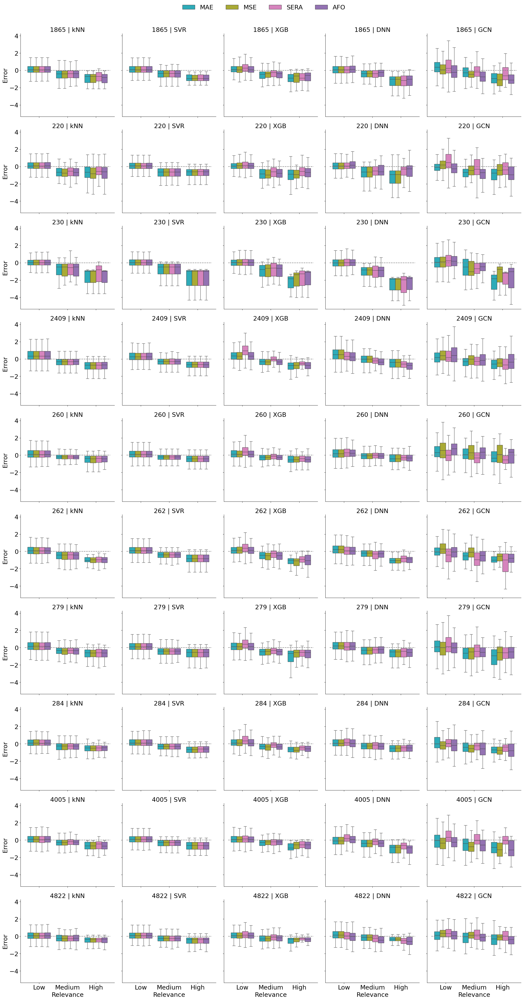

In [134]:
matplotlib.rcdefaults()
font = {'size': 21}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
ax = sns.catplot(x="Relevance", y="Error",
                                hue="Selection Metric", hue_order=['MAE',"MSE","SERA","AFO"],palette=["tab:cyan","tab:olive","tab:pink","tab:purple"],
                                data=data_relevance,
                                kind="box",
                                col="Algorithm",
                                #col_order=[str(j) for j in db_mean.index.to_list()],
                                #col_wrap=5,
                                row="Target ID",
                                aspect=1,
                                showfliers = False,
                                legend=True,
                                #sharey="row"
                            
                            )
for target, axes in ax.axes_dict.items():
        axes.hlines(y = 0 , xmin = -0.5, xmax = 2.5,#12.7
                linestyles = ["dashed"], colors = ["gray"])
ax.set_titles(col_template="{col_name}", row_template="{row_name}")
#ax.set_ylabels(f"Error (8<=Domain<9)")
ax.set_xlabels("Relevance")
ax = sns.move_legend(ax, "upper center", bbox_to_anchor=(.46, 1.02), ncol=4, title=None, frameon=False)
plt.subplots_adjust(bottom=0.1)
plt.savefig(F"results_plots/errors.png", dpi=300,bbox_inches="tight")

In [127]:
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix,accuracy_score
from math import ceil
data=test_predictions

class_metrics_dat=pd.DataFrame()
for target in data["Target ID"].unique():
    print(target[6:])
    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        for opt in ['MAE',"MSE","SERA","AFO"]:
         
          
            for size in range(10,60,10):
                aux_df=pd.DataFrame()
             
                for trial in data["trial"].unique():
                
                    df=data.loc[ (data["trial"]==trial) & (data["algorithm"]==alg) & (data["MetricOpt"]==opt) & (data["Target ID"]==target)]
                    df["predicted"]=df["predicted"].astype("float").values
                    total=len(df.Molecules.unique())
                
                    aux_df=pd.concat([aux_df,df.nlargest(int(size/5), 'predicted')])
                
                aux_df["label_true"]=[1 if true>=9 else 0 for true in aux_df["true"]]
                aux_df["label_pred"]=[1 if pred>=9 else 0 for pred in aux_df["predicted"]]

                precision=precision_score(aux_df["label_true"].values, aux_df["label_pred"].values)
            
                data_aux={ "Algorithm":[alg],
                            "Selection Metric":[opt],
                            "Algorithm_opt":["$"+alg+"_{"+opt+"}$"],
                            "Algorithm_opt_names":[alg+"_"+opt],
                            "Target ID":[target[6:]],
                            "Size-Rank":[size],
                            "class_metric":["Precision",],
                            "Precision":[precision]
                                }
                
                data_aux=pd.DataFrame(data_aux)
                    # data_aux2=pd.DataFrame(data_aux2)
                    
                class_metrics_dat=pd.concat([class_metrics_dat,data_aux])


1865


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

220


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

230


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

2409


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

260


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

262


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

279


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

284


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

4005


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

4822


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\2950353979.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

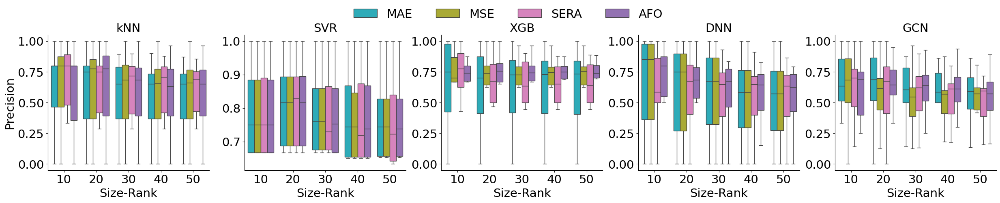

In [128]:
ax = sns.catplot(y="Precision", x="Size-Rank",
                       
                         hue="Selection Metric", hue_order=['MAE',"MSE","SERA", "AFO"],#hue_order=['Precision', "Recall (Sensitivity)"],
                         data=class_metrics_dat.groupby(["Selection Metric","class_metric","Algorithm", "Size-Rank", "Target ID"])["Precision"].mean().reset_index(),
                         kind="box",
                         col='Algorithm',
                         col_order=['kNN', 'SVR', 'XGB', 'DNN', 'GCN'], #['$MAE$',"$MSE$","$SERA$"]
                         
                         aspect=1,
                         palette=["tab:cyan","tab:olive","tab:pink","tab:purple"],
                         sharey=False, showfliers = False,
                         
        )
ax.set_titles(col_template="{col_name}",row_template="{row_name}")
ax = sns.move_legend(ax, "upper center", bbox_to_anchor=(.46, 1.06), ncol=4, title=None, frameon=False)
plt.savefig(F"results_plots/class_metrics.png", dpi=300,bbox_inches="tight")

In [129]:
data=test_predictions

predictions_high_potency=pd.DataFrame()
for target in data["Target ID"].unique():
  
    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        for opt in ['MAE',"MSE","SERA","AFO"]:
            for trial in data["trial"].unique():

                df=data.loc[ (data["trial"]==trial) & (data["algorithm"]==alg) & (data["MetricOpt"]==opt) & (data["Target ID"]==target)]
                df["predicted"]=df["predicted"].astype("float").values
               
                df = df.nlargest(2, 'predicted')
              
               
                data_aux={ "pIC50":df["true"].values,
                            "predicted":df["predicted"].values,
                            "Algorithm":np.repeat(alg,len(df.index)),
                            "Selection Metric":np.repeat(opt,len(df.index)),
                            "Algorithm_opt":np.repeat("$"+alg+"_{"+opt+"}$",len(df.index)),
                            "Algorithm_opt_names":np.repeat(alg+"_"+opt,len(df.index)),
                            "Target ID":[target[6:] for target in df["Target ID"].values],
                            "trial":df["trial"].values,
                            "Molecules": df["Molecules"].values,
                            "index": df["Index"].values
                                }
                data_aux=pd.DataFrame(data_aux)
                # data_aux2=pd.DataFrame(data_aux2)
                predictions_high_potency=pd.concat([predictions_high_potency,data_aux])

                
predictions_high_potency=predictions_high_potency.loc[(predictions_high_potency["predicted"]>=9)]

true_high_potency=predictions_high_potency.loc[(predictions_high_potency["pIC50"]>=9)]

C:\Users\brend\AppData\Local\Temp\ipykernel_32244\4191199700.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\4191199700.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["predicted"]=df["predicted"].astype("float").values
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\4191199700.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

<Figure size 1920x1440 with 0 Axes>

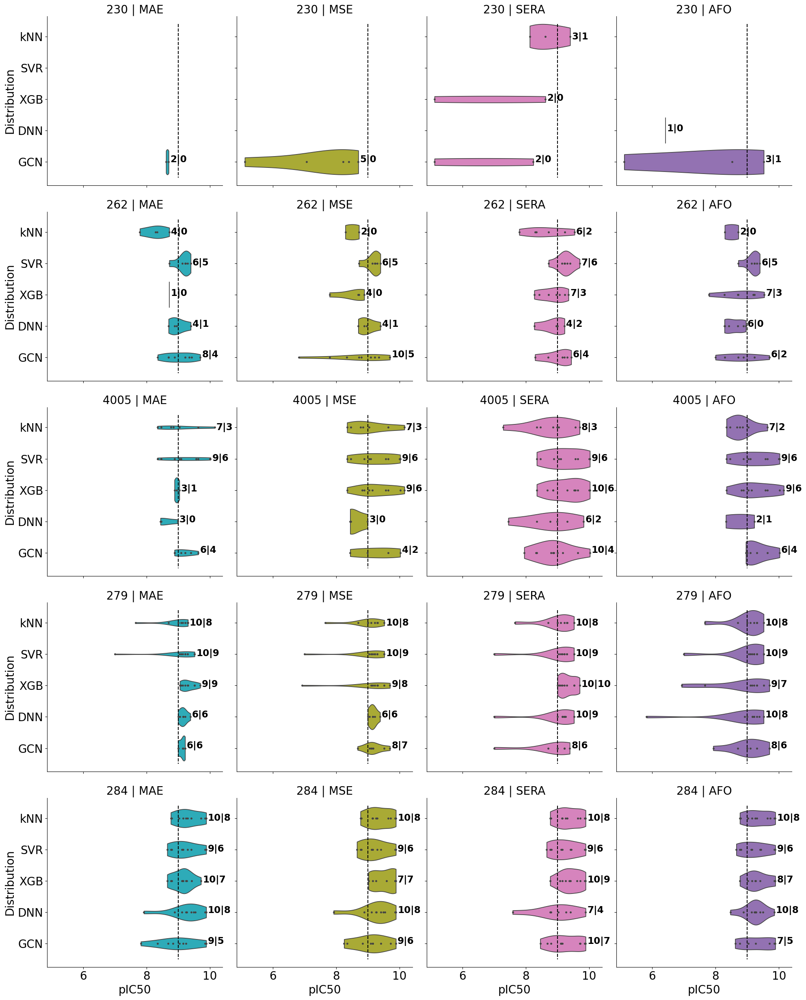

In [130]:
matplotlib.rcdefaults()
font = {'size': 20}
matplotlib.rc('font', **font)
plt.figure(dpi=300)




ax=sns.catplot(data=predictions_high_potency, x="pIC50", y="Algorithm", hue="Selection Metric",hue_order=['MAE',"MSE","SERA","AFO"],palette=["tab:cyan","tab:olive","tab:pink", "tab:purple"],
               row="Target ID",
               col="Selection Metric",
               row_order=["230",'262',"4005",'279',"284"],
               
               kind="violin",inner="point",cut=0, aspect=1,legend=False)
for (row,col), axes in ax.axes_dict.items():
   
    y_max= 4.5 #(bottom) 2.5
    y_min=-0.4#top
    
    axes.vlines(x = 9, ymin = y_min, ymax = y_max,linestyles = ["dashed"], colors = ["black"]) 
  
    steps=(y_max-y_min)/5
   
    ticks= np.arange(y_min,y_max,steps)
   
    i=0

    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        
            values_pred = predictions_high_potency.loc[(predictions_high_potency["Target ID"]==row) & (predictions_high_potency["Selection Metric"]==col) & (predictions_high_potency["Algorithm"]==alg),'pIC50']
            values_true = true_high_potency.loc[(true_high_potency["Target ID"]==row) & (true_high_potency["Selection Metric"]==col) & (true_high_potency["Algorithm"]==alg),'pIC50']
          
            if len(values_pred)!=0:
                fence=max(values_pred)+0.05 if (row!="220") and (row!="260") else min(values_pred)-1.3
                axes.text(
                        fence,
                        ticks[i]+0.4,
                        f"{len(values_pred)}|{len(values_true)}",
                        verticalalignment='center',
                        size='small',
                        color='black',
                        rotation=0,
                        weight="semibold",
                        )
            i+=1
        
            
ax.set_ylabels("Distribution")
#ax.set_xlabels("")
ax.set_titles("{row_name} | {col_name}")
#ax = sns.move_legend(ax, "upper center", ncol=4, bbox_to_anchor=(.46, 1.03), title=None, frameon=False) # bbox_to_anchor=(.46, 1.08)
plt.savefig("results_plots/distribution_predicted_potent_1.png", dpi=300,bbox_inches="tight")

<Figure size 1920x1440 with 0 Axes>

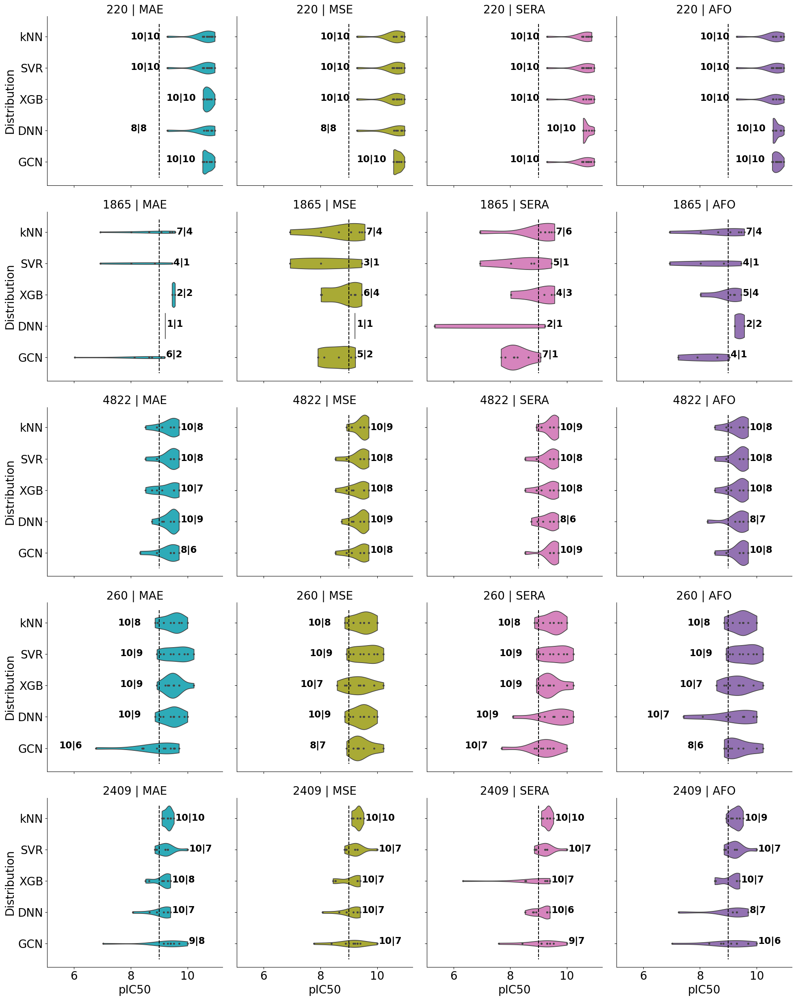

In [131]:
matplotlib.rcdefaults()
font = {'size': 20}
matplotlib.rc('font', **font)
plt.figure(dpi=300)




ax=sns.catplot(data=predictions_high_potency, x="pIC50", y="Algorithm", hue="Selection Metric",hue_order=['MAE',"MSE","SERA","AFO"],palette=["tab:cyan","tab:olive","tab:pink", "tab:purple"],
               row="Target ID",
               col="Selection Metric",
               row_order=["220",'1865','4822',"260",'2409'],
               
               kind="violin",inner="point",cut=0, aspect=1,legend=False)
for (row,col), axes in ax.axes_dict.items():
   
    y_max= 4.5 #(bottom) 2.5
    y_min=-0.4#top
    
    axes.vlines(x = 9, ymin = y_min, ymax = y_max,linestyles = ["dashed"], colors = ["black"]) 
  
    steps=(y_max-y_min)/5
   
    ticks= np.arange(y_min,y_max,steps)
   
    i=0

    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        
            values_pred = predictions_high_potency.loc[(predictions_high_potency["Target ID"]==row) & (predictions_high_potency["Selection Metric"]==col) & (predictions_high_potency["Algorithm"]==alg),'pIC50']
            values_true = true_high_potency.loc[(true_high_potency["Target ID"]==row) & (true_high_potency["Selection Metric"]==col) & (true_high_potency["Algorithm"]==alg),'pIC50']
          
            if len(values_pred)!=0:
                fence=max(values_pred)+0.05 if (row!="220") and (row!="260") else min(values_pred)-1.3
                axes.text(
                        fence,
                        ticks[i]+0.4,
                        f"{len(values_pred)}|{len(values_true)}",
                        verticalalignment='center',
                        size='small',
                        color='black',
                        rotation=0,
                        weight="semibold",
                        )
            i+=1
        
            
ax.set_ylabels("Distribution")
#ax.set_xlabels("")
ax.set_titles("{row_name} | {col_name}")
#ax = sns.move_legend(ax, "upper center", ncol=4, bbox_to_anchor=(.46, 1.03), title=None, frameon=False) # bbox_to_anchor=(.46, 1.08)
plt.savefig("results_plots/distribution_predicted_potent_2.png", dpi=300,bbox_inches="tight")

C:\Users\brend\AppData\Local\Temp\ipykernel_32244\436941076.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  values_dat["label_true"]=[1 if true>=9 else 0 for true in values_dat["pIC50"]]
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\436941076.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  values_dat["label_pred"]=[1 if pred>=9 else 0 for pred in values_dat["predicted"]]
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\436941076.py:16: SettingWithCopyWarning: 
A value is trying to be set on a

<Figure size 1920x1440 with 0 Axes>

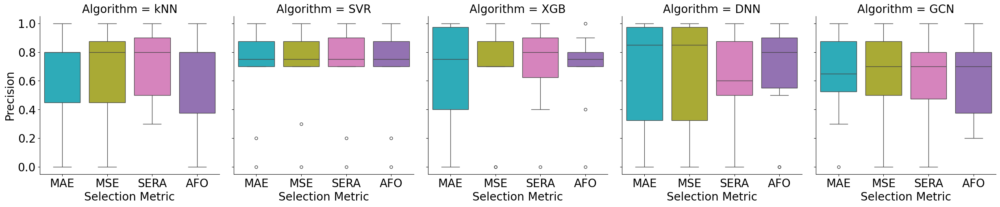

In [144]:
matplotlib.rcdefaults()
font = {'size': 20}
matplotlib.rc('font', **font)
plt.figure(dpi=300)

from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix,accuracy_score
from math import ceil
precision_data=pd.DataFrame()
for target in predictions_high_potency["Target ID"].unique():#
  
    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        for opt in ['MAE',"MSE","SERA", "AFO"]:

            values_dat=predictions_high_potency.loc[ (predictions_high_potency["Algorithm"]==alg) & (predictions_high_potency["Selection Metric"]==opt) & (predictions_high_potency["Target ID"]==target)]
            values_dat["label_true"]=[1 if true>=9 else 0 for true in values_dat["pIC50"]]
            values_dat["label_pred"]=[1 if pred>=9 else 0 for pred in values_dat["predicted"]]
            precision=precision_score(values_dat["label_true"].values, values_dat["label_pred"].values)
           
            data_aux={  "Precision": [round(precision,1)],
                        "Algorithm":[alg],
                        "Selection Metric":[opt],
                        "Target ID":[target],
                       

                            }
            data_aux=pd.DataFrame(data_aux)
            # data_aux2=pd.DataFrame(data_aux2)
            precision_data=pd.concat([precision_data,data_aux])

precision_data["Algorithm_opt"]="$"+precision_data["Algorithm"]+"_{"+precision_data["Selection Metric"]+"}$"
precision_dat=pd.DataFrame(precision_data.pivot(index='Algorithm_opt', columns='Target ID',values="Precision").reset_index())
precision_dat=precision_dat.iloc[[17,9,13,1,5,18,10,14,2,6,19,11,15,3,7,16,8,12,0,4],[0,3,2,9,10,6,1,7,5,8,4]]

precision_dat.to_csv(f"precision.csv")

ax=sns.catplot(data=precision_data, y="Precision", x="Selection Metric", hue="Selection Metric",palette=["tab:cyan","tab:olive","tab:pink", "tab:purple"], 
               col="Algorithm",
               kind="box", 
            
               )

plt.subplots_adjust(bottom=0.1)
plt.savefig("results_plots/precision.png", dpi=300,bbox_inches="tight")
plt.show()

## High potency plots

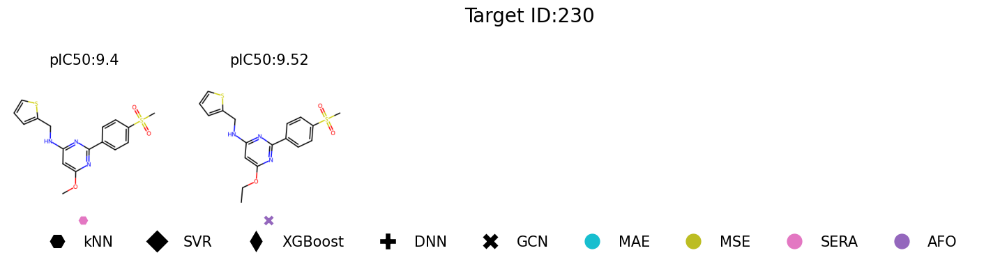

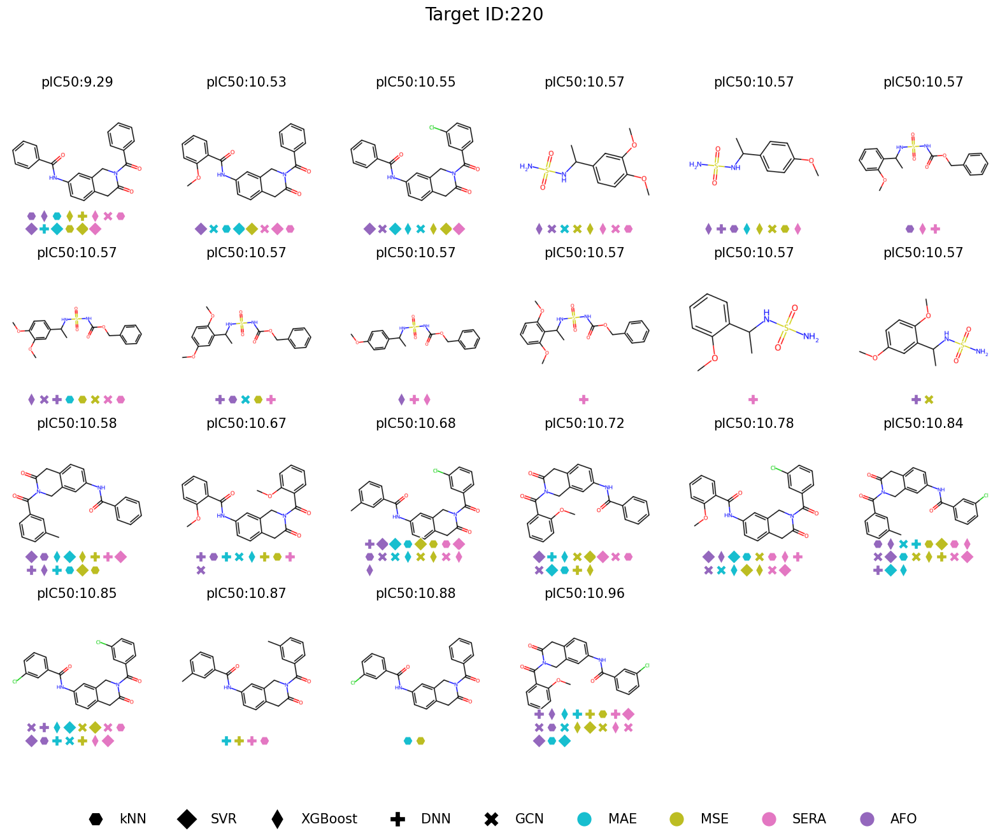

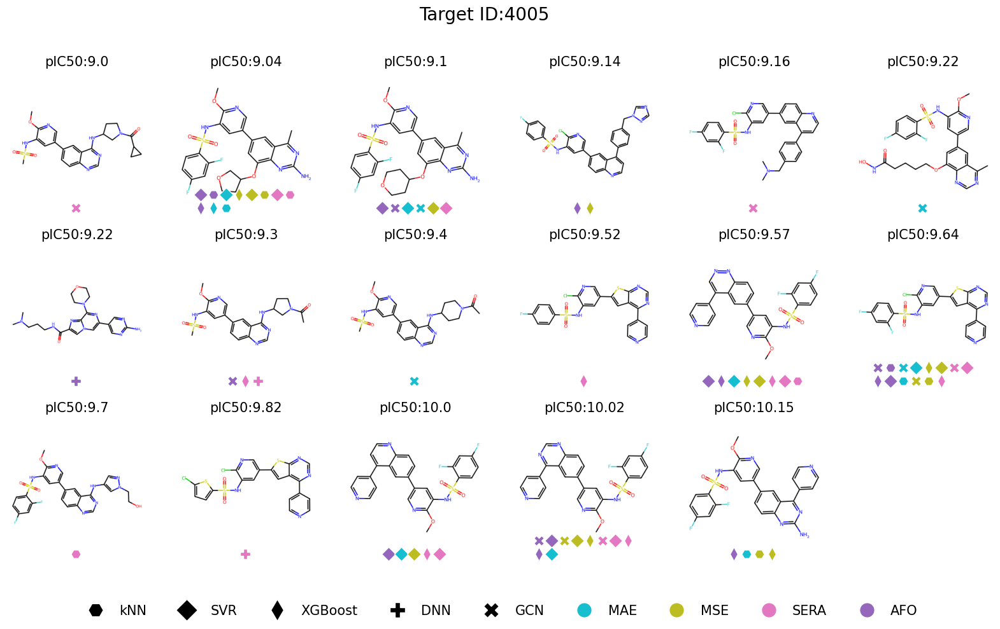

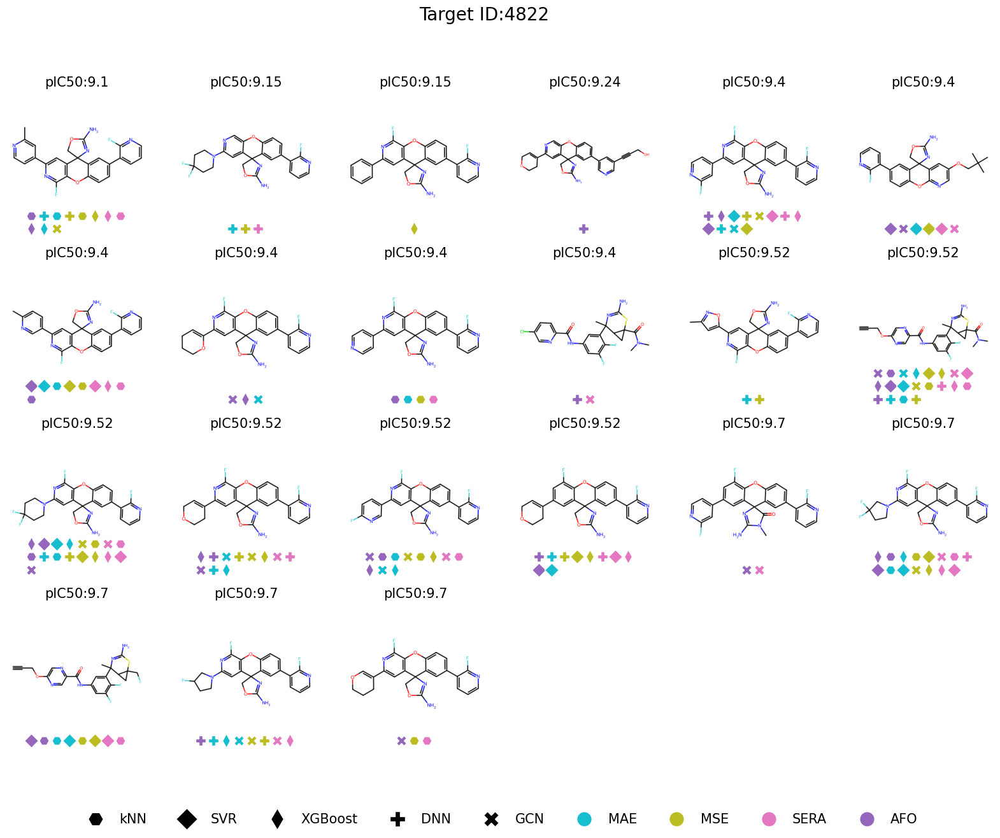

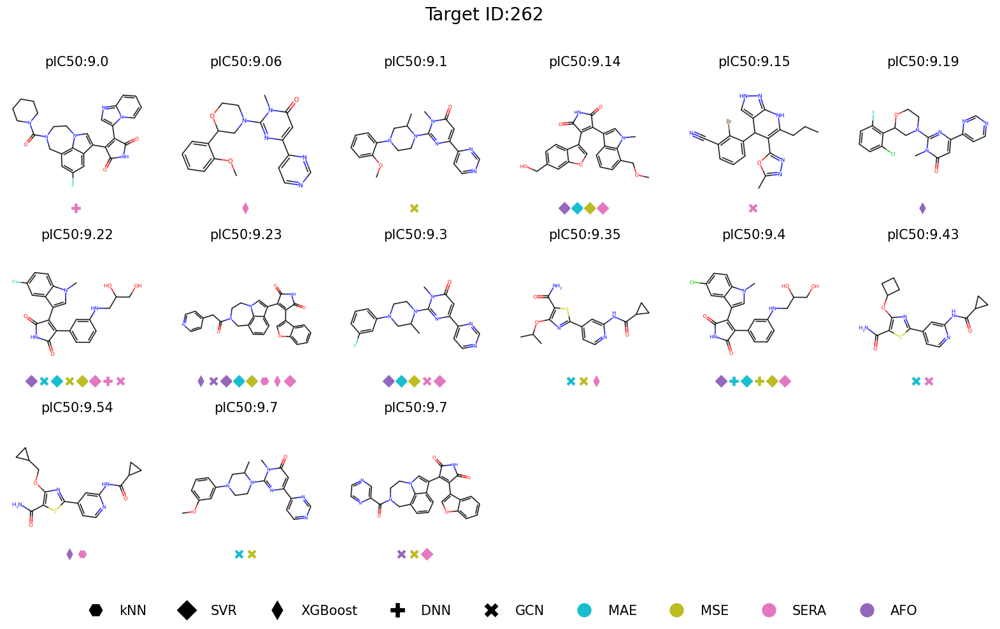

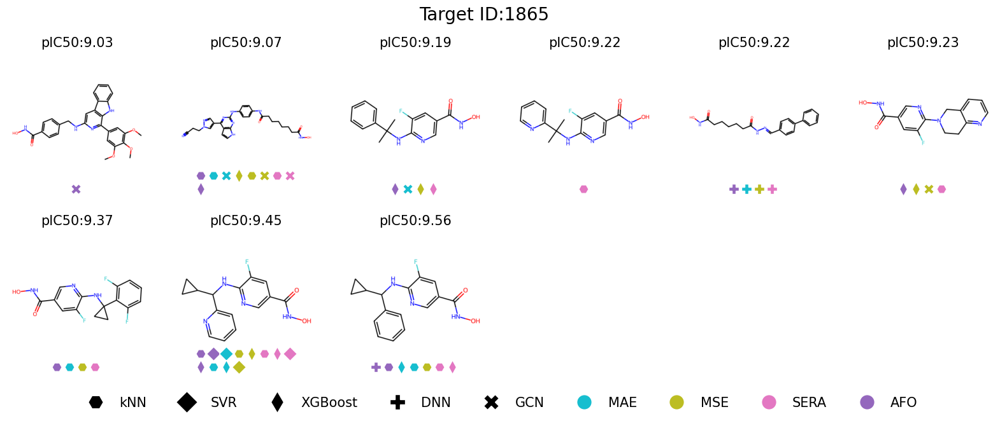

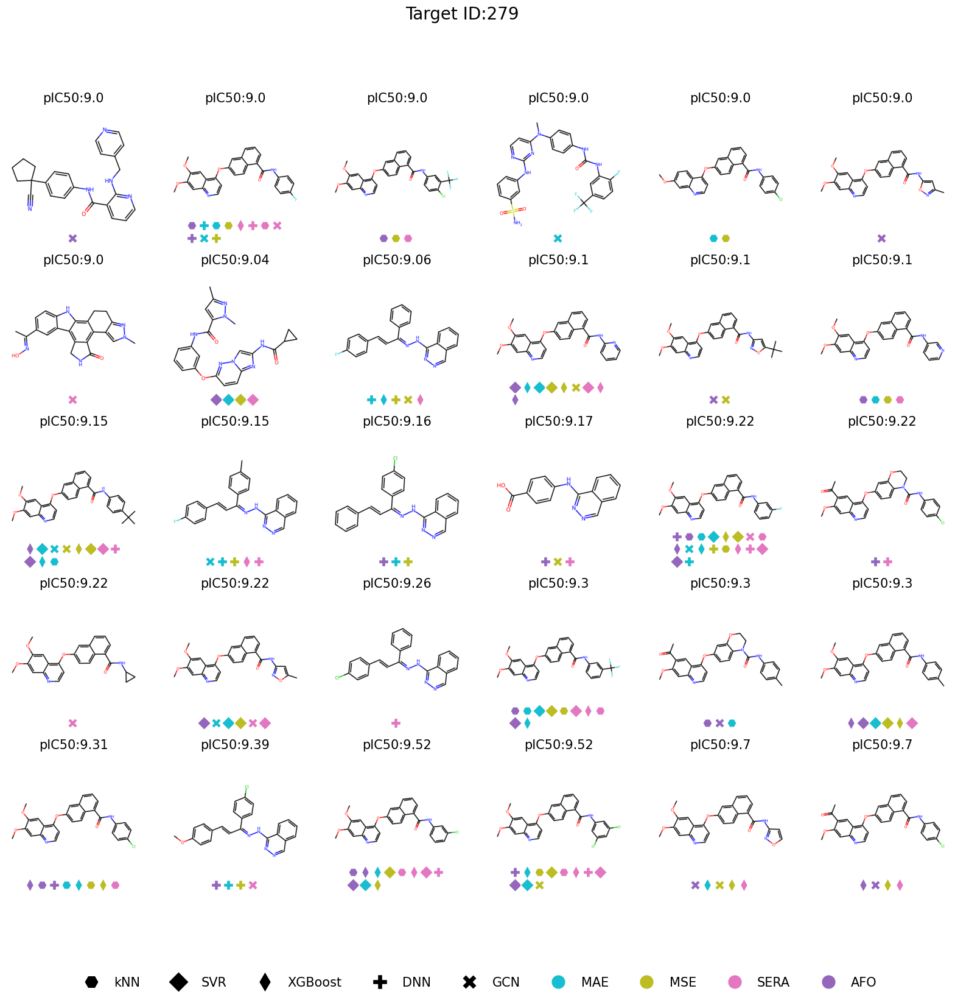

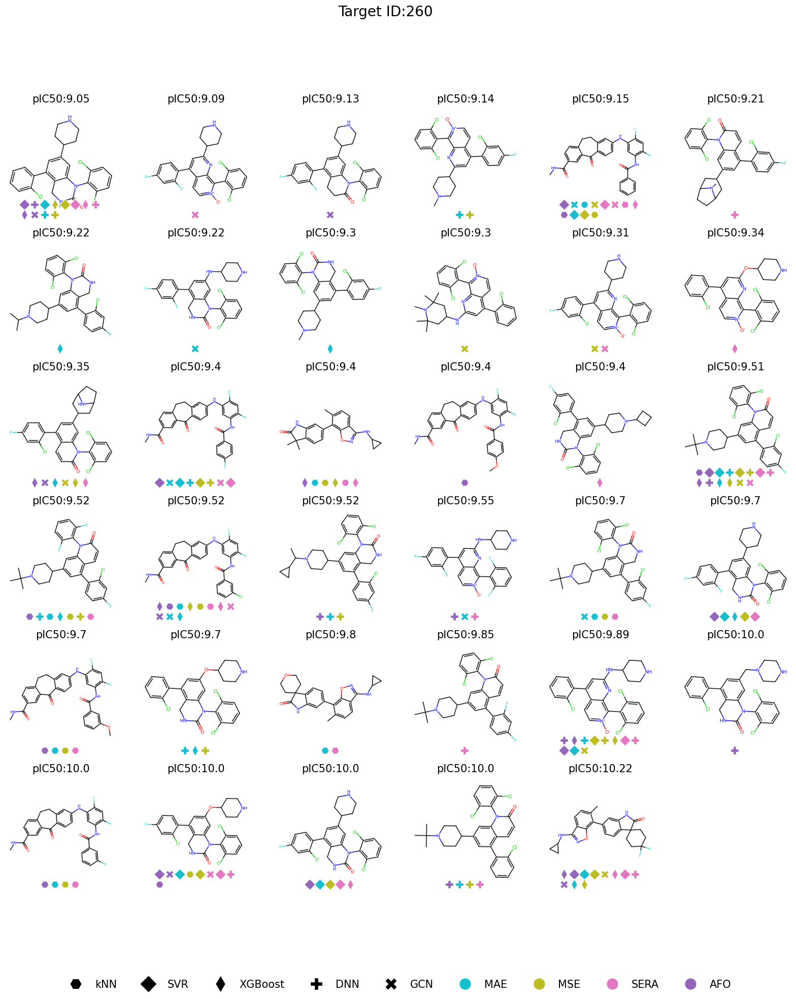

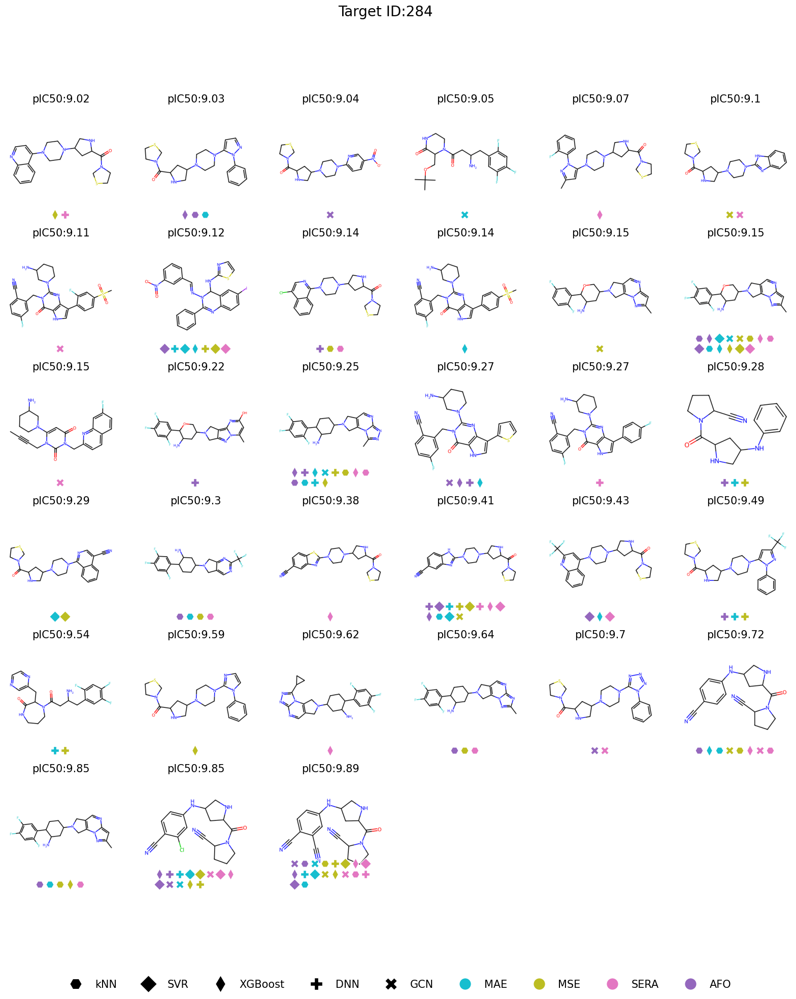

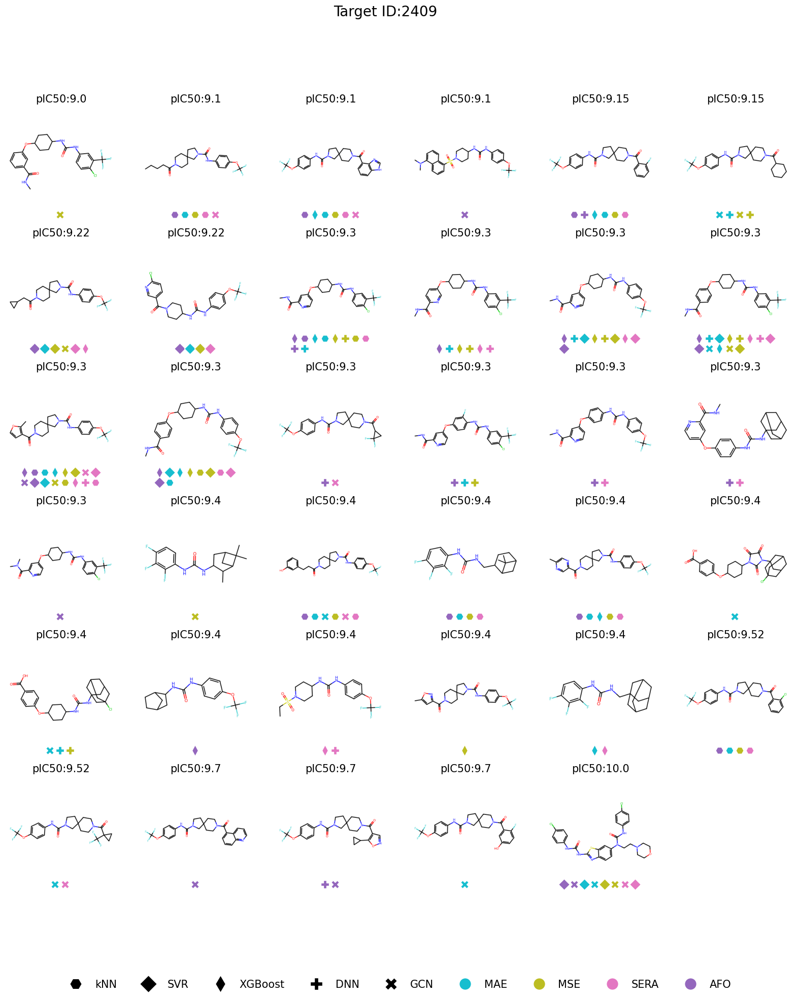

In [ ]:

from matplotlib import pyplot as plt 
from matplotlib.lines import Line2D




columns = 6
for target in [str(i) for i in db_mean.index]:

    i=1
    test2=true_high_potency[(true_high_potency["Target ID"]==target) & ((true_high_potency["Selection Metric"]=="AFO") | (test["Selection Metric"]=="SERA") | (test["Selection Metric"]=="MAE") | (test["Selection Metric"]=="MSE"))].sort_values("pIC50",ascending=True)
  
    molecules=test2["Molecules"].unique()
    
    rows=round(len(molecules)/columns)
    if rows < (len(molecules)/columns):
           rows=rows+1
  
    fig = plt.figure(figsize=(20, 10*(rows/3)))
    for mol in molecules:
        algs_opt=test2.loc[test2["Molecules"]==mol]["Algorithm_opt_names"].unique()
        pIC50=test2.loc[test2["Molecules"]==mol]["pIC50"].unique()[0]
        algs_opt=[alg.split("_") for alg in algs_opt]
        
        mol=Chem.MolFromSmiles(mol)
        img = Chem.Draw.MolToImage(mol)
        fig.add_subplot(rows, columns, i) 
        # showing image 
        plt.imshow(img) 
        plt.xticks([]) 
        plt.yticks([]) 
        plt.box(on=None)
        

        plt.title(f"pIC50:{round(pIC50,2)}",fontdict={"fontsize":15})

        legend_elements=[]
        marker_dict={"kNN":'H',"SVR":'D',"XGB":'d',"DNN":'P',"GCN":"X"}
        color_dict={"MAE":"tab:cyan","MSE":"tab:olive","SERA":"tab:pink", "AFO":"tab:purple"}
        
        algs_opt.sort(key = lambda x: x[1])
     
        for [alg,opt] in algs_opt:
                legend_elements.append(Line2D([0], [0], marker=marker_dict[alg], color='white', label='', 
                          markerfacecolor=color_dict[opt], markersize=11))
                


        i+=1
        plt.legend(handles=legend_elements, loc='lower center',ncols=8,frameon=False, fontsize=3, labelspacing=4)

    legend_alg = [Line2D([0], [0], marker='H', color='white', label='kNN',
                                markerfacecolor='black', markersize=17),
                        Line2D([0], [0], marker='D', color='white', label='SVR',
                                markerfacecolor='black', markersize=17),
                        Line2D([0], [0], marker='d', color='white', label='XGBoost',
                                markerfacecolor='black', markersize=17),
                        Line2D([0], [0], marker='P', color='white', label='DNN',
                                markerfacecolor='black', markersize=17),
                        Line2D([0], [0], marker='X', color='white', label='GCN',
                                markerfacecolor='black', markersize=17),
                             
                        Line2D([0], [0], marker='o', color='white', label='MAE', 
                                markerfacecolor='tab:cyan', markersize=17),
                        Line2D([0], [0], marker='o', color='white', label='MSE', 
                                markerfacecolor='tab:olive', markersize=17),
                        Line2D([0], [0], marker='o', color='white', label='SERA', 
                                markerfacecolor='tab:pink', markersize=17),
                        Line2D([0], [0], marker='o', color='white', label='AFO', 
                                markerfacecolor='tab:purple', markersize=17)]

   
    fig.legend(handles=legend_alg, loc='outside lower center',ncols=9,frameon=False,fontsize=15)
 

    if rows==1:
           y=1.1
    else:
           y=0.98
    fig.suptitle(f"Target ID:{target}",fontsize=20,y=y)
    plt.savefig(f"results_plots/molecules_{target}.png", dpi=300,bbox_inches="tight")
    plt.show()

  


C:\Users\brend\AppData\Local\Temp\ipykernel_32244\979045418.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2.loc[ (test2["Molecules"].isin(list(intersection_set_unique))) & (~test2["Molecules"].isin(list(intersection_set_same_metric))) & (~test2["Molecules"].isin(list(intersection_set_same_model))),"groups"]="Other"
C:\Users\brend\AppData\Local\Temp\ipykernel_32244\979045418.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2.loc[ (test2["Molecules"].isin(list(intersection_set_unique))) & (

<Figure size 1920x1440 with 0 Axes>

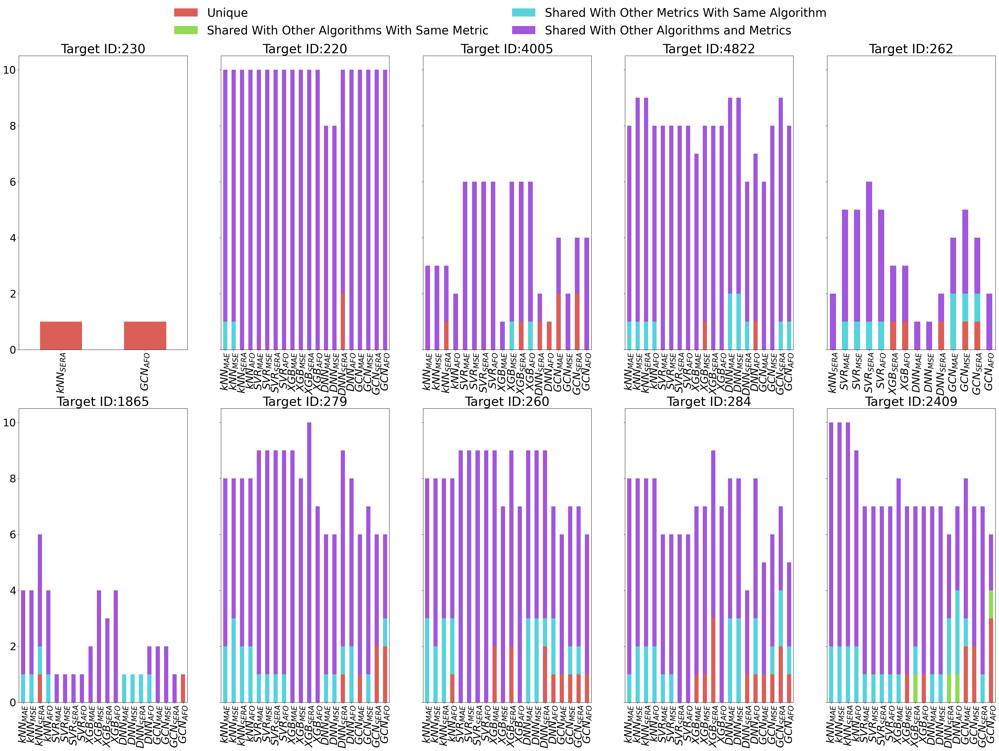

In [146]:
import pandas as pd
#import seaborn as sns
import matplotlib.pyplot as plt
matplotlib.rcdefaults()
font = {'size': 27}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
fig, axs = plt.subplots(2,5,figsize=(45,30),sharex=False, sharey=True)

k=0
j=0

for target in [str(i) for i in db_mean.index]:
    test2=true_high_potency[((true_high_potency["Selection Metric"]=="AFO") | (true_high_potency["Selection Metric"]=="SERA") | (true_high_potency["Selection Metric"]=="MAE") | (true_high_potency["Selection Metric"]=="MSE")) & (true_high_potency["Target ID"]==target)]

   
    groups=pd.DataFrame()
 
    for alg in ["kNN","SVR","XGB","DNN","GCN"]:
        for opt in ["MAE","MSE","SERA","AFO"]:
            alg_opt_list=[alg,opt]
            alg_opt=alg+"_"+opt
            if alg_opt not in test2["Algorithm_opt_names"].values:
                continue
            
            mols=test2.loc[test2["Algorithm_opt_names"]==alg_opt,"Molecules"].values
           
            
            #unique
            mols_test_unique=test2.loc[(test2["Algorithm_opt_names"]!=alg_opt),"Molecules"].values
            intersection_set_unique = set(mols_test_unique).intersection(set(mols))
       
            #shared with other models but same metric only
            mols_test_same_metric=test2.loc[(test2["Algorithm"]!=alg_opt_list[0]) & (test2["Selection Metric"]==alg_opt_list[1]) ,"Molecules"].values
            mols_test_other_metric=test2.loc[(test2["Selection Metric"]!=alg_opt_list[1]) ,"Molecules"].values
       
            intersection_set_same_metric = set(mols_test_same_metric).intersection(set(mols))-set(mols_test_other_metric)
            
            
            #shared with other metrics but same model only
            mols_test_same_model=test2.loc[(test2["Algorithm"]==alg_opt_list[0]) & (test2["Selection Metric"]!=alg_opt_list[1]) ,"Molecules"].values
            mols_test_other_model=test2.loc[(test2["Algorithm"]!=alg_opt_list[0]) ,"Molecules"].values
            mols_test_same_model_set=set(mols_test_same_model)
            intersection_set_same_model = (mols_test_same_model_set).intersection(set(mols))-set(mols_test_other_model)
        

            #shared with other metrics and models 
            n_intersection_set_others = len(mols)-(len(mols)-len(intersection_set_unique))-len(intersection_set_same_metric)-len(intersection_set_same_model)
            test2.loc[ (test2["Molecules"].isin(list(intersection_set_unique))) & (~test2["Molecules"].isin(list(intersection_set_same_metric))) & (~test2["Molecules"].isin(list(intersection_set_same_model))),"groups"]="Other"
            
            data_aux=pd.DataFrame({ 
                                    "Unique":[len(set(mols)-set(mols_test_unique))],
                                    "Shared With Other Algorithms With Same Metric": [len(intersection_set_same_metric)],
                                    "Shared With Other Metrics With Same Algorithm": [len(intersection_set_same_model)],
                                    "Shared With Other Algorithms and Metrics":[n_intersection_set_others],
                                    "Algorithm_opt":[test2.loc[test2["Algorithm_opt_names"]==alg_opt,"Algorithm_opt"].values[0]]
                                        })
        
                        # data_aux2=pd.DataFrame(data_aux2)
            groups=pd.concat([groups,data_aux])
  
    groups=groups.set_index("Algorithm_opt")
    
    # create stacked bar chart for students DataFrame
   
    groups.plot(kind='bar', stacked=True, color=sns.color_palette("hls", 4),ax=axs[k,j],legend=False)
    
    axs[k,j].set_title(f"Target ID:{target}")
    axs[k,j].set_xlabel("")
    #axs[k,j].set_ylim(0, 11)
    if (k==0) & (j==2):
        axs[k,j].legend(loc="upper center",ncols=2,fontsize=30,frameon=False,bbox_to_anchor=(.46, 1.2))

    j+=1
    if j==5:
       j=0
       k=1
    
  
plt.savefig(f"results_plots/molecules.png", dpi=300,bbox_inches="tight")
plt.show()




<Figure size 1920x1440 with 0 Axes>

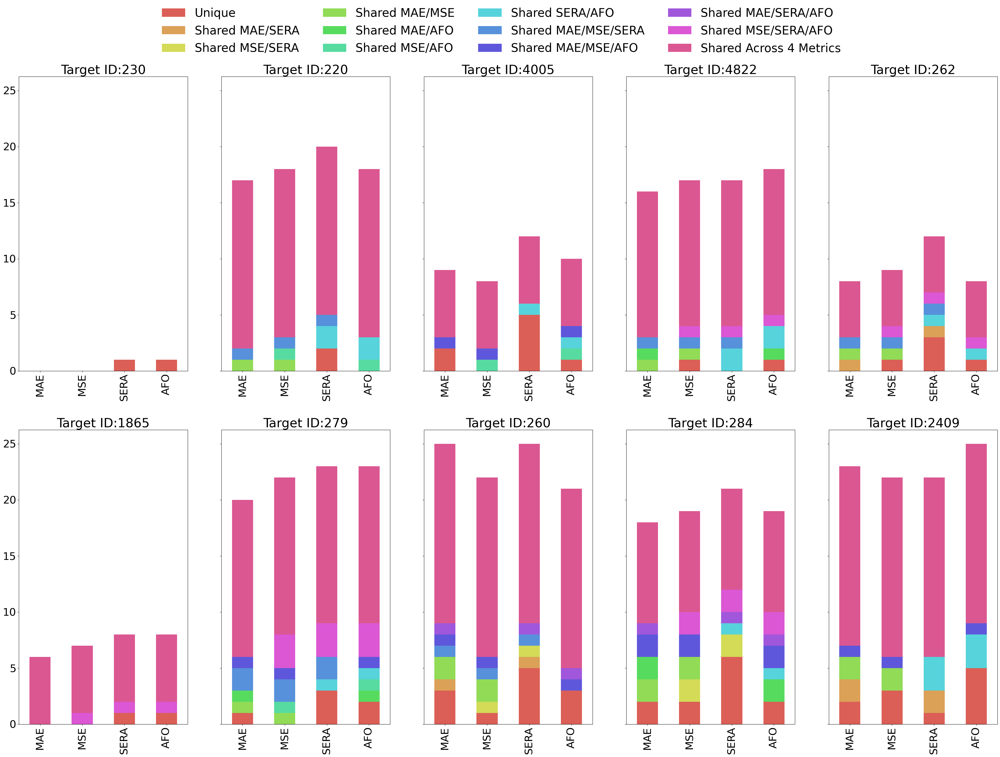

In [148]:
import pandas as pd
#import seaborn as sns
import matplotlib.pyplot as plt
matplotlib.rcdefaults()
font = {'size': 27}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
fig, axs = plt.subplots(2,5,figsize=(45,30),sharex=False, sharey=True)

k=0
j=0

for target in [str(i) for i in db_mean.index]:
  
    test2=true_high_potency[ (true_high_potency["Target ID"]==target)]
    mols_mae=set(test2.loc[(test2["Selection Metric"]=="MAE"),"Molecules"].values)
    mols_mse=set(test2.loc[(test2["Selection Metric"]=="MSE") ,"Molecules"].values)
    mols_sera=set(test2.loc[(test2["Selection Metric"]=="SERA") ,"Molecules"].values)
    mols_oracle=set(test2.loc[(test2["Selection Metric"]=="AFO") ,"Molecules"].values)

    groups=pd.DataFrame()
   
   # test2["groups"]=None
    for metric in ["MAE","MSE","SERA","AFO"]:
       
        mols=test2.loc[test2["Selection Metric"]==metric,"Molecules"].values
        
        #unique
        
        mols_test_other_metric=test2.loc[(test2["Selection Metric"]!=metric),"Molecules"].values
        intersection_set_unique = set(mols_test_other_metric).intersection(set(mols))
        
        if metric=="MAE":
      

            intersection_mae_oracle= set(mols_oracle).intersection(set(mols))-set(mols_sera)-set(mols_mse)
            intersection_mae_mse= set(mols_mse).intersection(set(mols))-set(mols_sera)-set(mols_oracle)
            intersection_sera_mae= set(mols_sera).intersection(set(mols))-set(mols_mse)-set(mols_oracle)
            intersection_sera_mse= set([])
            intersection_mse_oracle= set([])
            intersection_sera_oracle= set([])
        
            mols_test=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols_oracle))
            intersection4= set(mols_test).intersection(set(mols))

            mols_mae_mse_oracle=set(set(mols_mse).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
            mols_mae_sera_oracle=set(set(mols_oracle).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
            mols_mse_sera_oracle=set([])
            mols_mae_mse_sera=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
            
        elif metric=="MSE":
        
            intersection_mae_oracle= set([])
            intersection_mae_mse= set(mols_mae).intersection(set(mols))-set(mols_sera)-set(mols_oracle)
            intersection_sera_mae= set([])
            intersection_sera_mse= set(mols_sera).intersection(set(mols))-set(mols_mae)-set(mols_oracle)
            intersection_mse_oracle= set(mols_oracle).intersection(set(mols))-set(mols_sera)-set(mols_mae)
            intersection_sera_oracle= set([])
        
            mols_test=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols_oracle))
            intersection4= set(mols_test).intersection(set(mols))

            mols_mae_mse_oracle=set(set(mols_mae).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
            mols_mae_sera_oracle=set([])
            mols_mse_sera_oracle=set(set(mols_sera).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
            mols_mae_mse_sera=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
            
        elif metric=="SERA":
            
            intersection_mae_oracle= set([])
            intersection_mae_mse= set([])
            intersection_sera_mae= set(mols_mae).intersection(set(mols))-set(mols_mse)-set(mols_oracle)
            intersection_sera_mse= set(mols_mse).intersection(set(mols))-set(mols_mae)-set(mols_oracle)
            intersection_mse_oracle= set([])
            intersection_sera_oracle= set(mols_oracle).intersection(set(mols))-set(mols_mse)-set(mols_mae)

        
            mols_test=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols_oracle))
            intersection4= set(mols_test).intersection(set(mols))

            mols_mae_mse_oracle=set([])
            mols_mae_sera_oracle=set(set(mols_mae).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
            mols_mse_sera_oracle=set(set(mols_mse).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
            mols_mae_mse_sera=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols))-set(intersection4)
        else:
            
            intersection_mae_oracle= set(mols_mae).intersection(set(mols))-set(mols_mse)-set(mols_sera)
            intersection_mae_mse= set([])
            intersection_sera_mae= set([])
            intersection_sera_mse= set([])
            intersection_mse_oracle= set(mols_mse).intersection(set(mols))-set(mols_mae)-set(mols_sera)
            intersection_sera_oracle= set(mols_sera).intersection(set(mols))-set(mols_mse)-set(mols_mae)

        
            mols_test=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols_sera))
            intersection4= set(mols_test).intersection(set(mols))

            mols_mae_mse_oracle=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols))-set(intersection4)
            mols_mae_sera_oracle=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
            mols_mse_sera_oracle=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
            mols_mae_mse_sera=set([])

        
    
        data_aux=pd.DataFrame({ 
                                "Unique":[len(set(mols)-set(mols_test_other_metric))],
                                "Shared MAE/SERA":[len(intersection_sera_mae)],
                                "Shared MSE/SERA":[len(intersection_sera_mse)],
                                "Shared MAE/MSE":[len(intersection_mae_mse)],
                                "Shared MAE/AFO":[len(intersection_mae_oracle)],
                                "Shared MSE/AFO":[len(intersection_mse_oracle)],
                                "Shared SERA/AFO":[len(intersection_sera_oracle)],
                                "Shared MAE/MSE/SERA":[len(mols_mae_mse_sera)],
                                "Shared MAE/MSE/AFO":[len(mols_mae_mse_oracle)],
                                "Shared MAE/SERA/AFO":[len(mols_mae_sera_oracle)],
                                "Shared MSE/SERA/AFO":[len(mols_mse_sera_oracle)],
                                "Shared Across 4 Metrics":[len(intersection4)],
                                "Metric":[metric]
                                    })

                    # data_aux2=pd.DataFrame(data_aux2)
        groups=pd.concat([groups,data_aux])


    groups=groups.set_index("Metric")
    
    # create stacked bar chart for students DataFrame
    #c=sns.color_palette("tab20", 12)[6:12]+sns.color_palette("tab20", 12)[2:6]+sns.color_palette("tab20", 12)[0:2]
    groups.plot(kind='bar', stacked=True, color=sns.color_palette("hls",12),ax=axs[k,j],legend=False)
    
    axs[k,j].set_title(f"Target ID:{target}")
    axs[k,j].set_xlabel("")
    #axs[k,j].set_ylim(0, 11)
    if (k==0) & (j==2):
        axs[k,j].legend(loc="upper center",ncols=4,fontsize=30,frameon=False,bbox_to_anchor=(.46, 1.27))
    
    
    j+=1
    if j==5:
       j=0
       k=1
plt.savefig(f"results_plots/molecules_metrics.png", dpi=300,bbox_inches="tight")
plt.show()
    # Add Title and Labels
#plt.title('Intermediate Students Pass %')
#plt.xlabel('Model')
#plt.ylabel('Number of Molecules')




<Figure size 1920x1440 with 0 Axes>

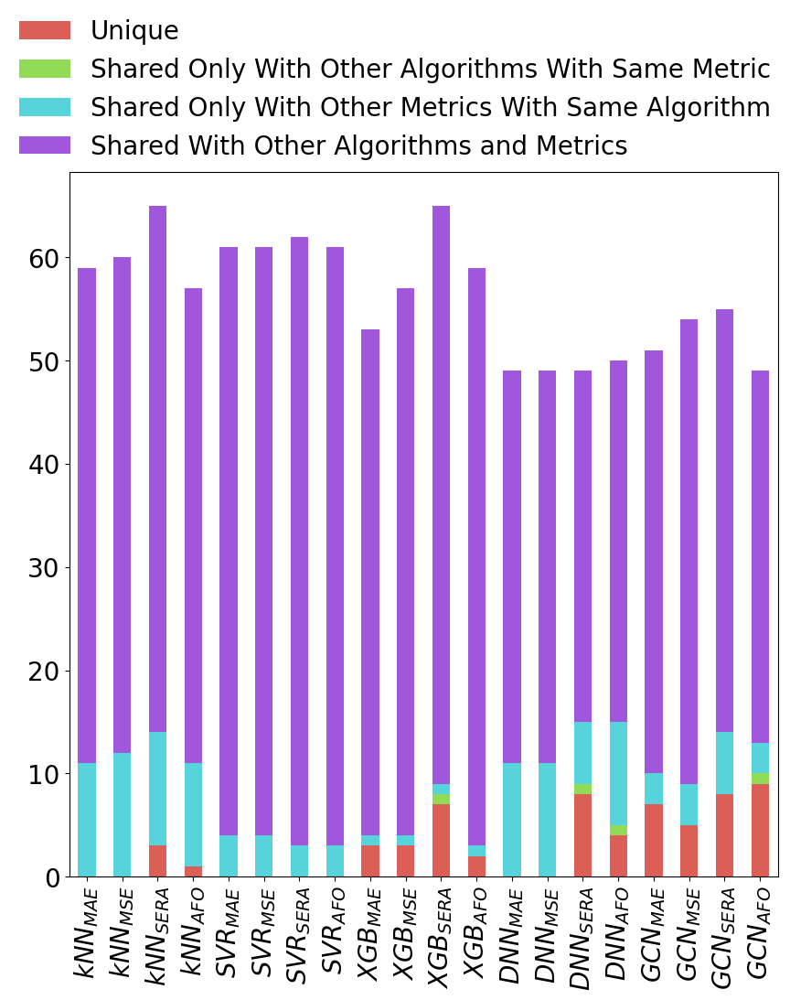

In [154]:
import pandas as pd
#import seaborn as sns
import matplotlib.pyplot as plt
matplotlib.rcdefaults()
font = {'size': 20}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
fig, axs = plt.subplots(1,1,figsize=(10,10))


groups=pd.DataFrame()

for alg_opt in true_high_potency["Algorithm_opt_names"].unique():
    
    alg_opt_list=alg_opt.split("_")
    mols=true_high_potency.loc[true_high_potency["Algorithm_opt_names"]==alg_opt,"Molecules"].values

    #unique
    mols_test_unique=true_high_potency.loc[(true_high_potency["Algorithm_opt_names"]!=alg_opt),"Molecules"].values
    intersection_set_unique = set(mols_test_unique).intersection(set(mols))

    #shared with other models but same metric only
    mols_test_same_metric=true_high_potency.loc[(true_high_potency["Algorithm"]!=alg_opt_list[0]) & (true_high_potency["Selection Metric"]==alg_opt_list[1]) ,"Molecules"].values
    mols_test_other_metric=true_high_potency.loc[(true_high_potency["Selection Metric"]!=alg_opt_list[1]) ,"Molecules"].values
    mols_test_same_metric_set=set(mols_test_same_metric)-set(mols_test_other_metric)
    intersection_set_same_metric = (mols_test_same_metric_set).intersection(set(mols))


    #shared with other metrics but same model only
    mols_test_same_model=true_high_potency.loc[(true_high_potency["Algorithm"]==alg_opt_list[0]) & (true_high_potency["Selection Metric"]!=alg_opt_list[1]) ,"Molecules"].values
    mols_test_other_model=true_high_potency.loc[(true_high_potency["Algorithm"]!=alg_opt_list[0]) ,"Molecules"].values
    mols_test_same_model_set=set(mols_test_same_model)-set(mols_test_other_model)
    intersection_set_same_model = (mols_test_same_model_set).intersection(set(mols))


    #shared with other metrics and models 
    n_intersection_set_others = len(mols)-(len(mols)-len(intersection_set_unique))-len(intersection_set_same_metric)-len(intersection_set_same_model)
    #test2.loc[ (true_high_potency["Molecules"].isin(list(intersection_set_unique))) & (~true_high_potency["Molecules"].isin(list(intersection_set_same_metric))) & (~true_high_potency["Molecules"].isin(list(intersection_set_same_model))),"groups"]="Other"

    data_aux=pd.DataFrame({ 
                            "Unique":[len(mols)-len(intersection_set_unique)],
                            "Shared Only With Other Algorithms With Same Metric": [len(intersection_set_same_metric)],
                            "Shared Only With Other Metrics With Same Algorithm": [len(intersection_set_same_model)],
                            "Shared With Other Algorithms and Metrics":[n_intersection_set_others],
                            "Algorithm_opt":[true_high_potency.loc[true_high_potency["Algorithm_opt_names"]==alg_opt,"Algorithm_opt"].values[0]],
                            "Algorithm":[alg_opt_list[0]],
                            "Metric":[alg_opt_list[1]]
                                })

                # data_aux2=pd.DataFrame(data_aux2)
    groups=pd.concat([groups,data_aux])


groups=groups.set_index("Algorithm_opt")


# create stacked bar chart for students DataFrame

groups.plot(kind='bar', stacked=True, color=sns.color_palette("hls", 4),ax=axs,legend=False)


axs.set_title(f"")
axs.set_xlabel("")
#axs[k,j].set_ylim(0, 11)


axs.legend(loc="upper center",ncols=1,fontsize=20,frameon=False,bbox_to_anchor=(.46, 1.25))


plt.savefig(f"results_plots/molecules_general.png", dpi=300,bbox_inches="tight")
plt.show()



<Figure size 1920x1440 with 0 Axes>

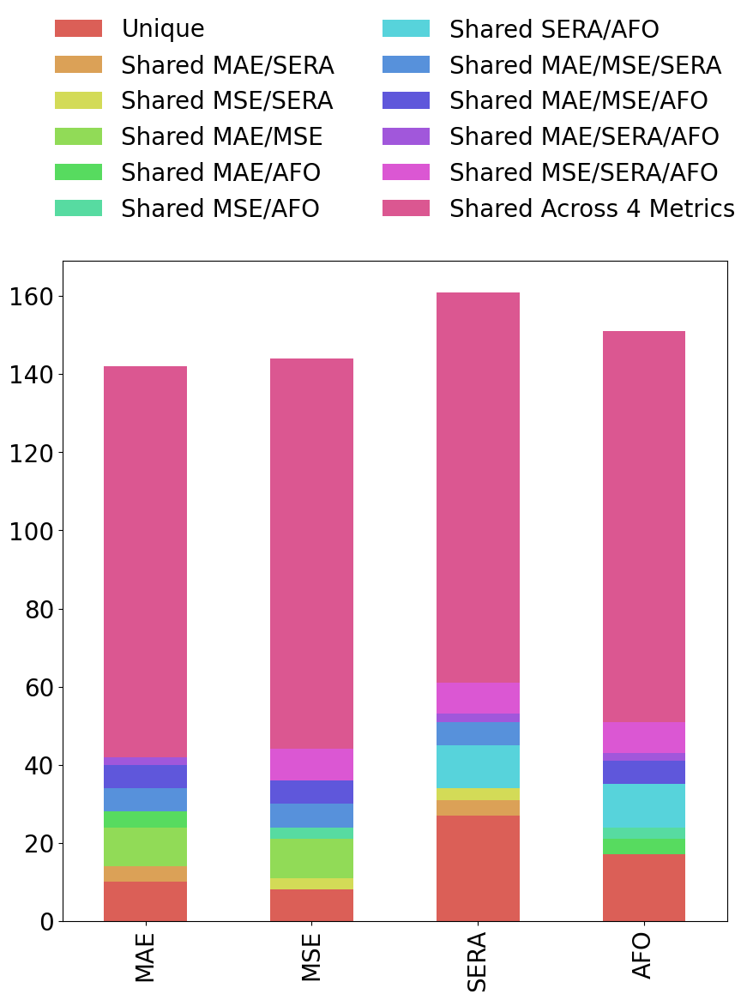

In [152]:
import pandas as pd
#import seaborn as sns
import matplotlib.pyplot as plt
matplotlib.rcdefaults()
font = {'size': 20}
matplotlib.rc('font', **font)
plt.figure(dpi=300)
fig, axs = plt.subplots(1,1,figsize=(10,10))





mols_mae=set(true_high_potency.loc[(true_high_potency["Selection Metric"]=="MAE"),"Molecules"].values)
mols_mse=set(true_high_potency.loc[(true_high_potency["Selection Metric"]=="MSE") ,"Molecules"].values)
mols_sera=set(true_high_potency.loc[(true_high_potency["Selection Metric"]=="SERA") ,"Molecules"].values)
mols_oracle=set(true_high_potency.loc[(true_high_potency["Selection Metric"]=="AFO") ,"Molecules"].values)

groups=pd.DataFrame()

for metric in ["MAE","MSE","SERA","AFO"]:
   
    mols=set(true_high_potency.loc[true_high_potency["Selection Metric"]==metric,"Molecules"].values)
   
    #unique

    mols_test_other_metric=true_high_potency.loc[(true_high_potency["Selection Metric"]!=metric),"Molecules"].values
    intersection_set_unique = set(mols_test_other_metric).intersection(set(mols))
    
    if metric=="MAE":
      

        intersection_mae_oracle= set(mols_oracle).intersection(set(mols))-set(mols_sera)-set(mols_mse)
        intersection_mae_mse= set(mols_mse).intersection(set(mols))-set(mols_sera)-set(mols_oracle)
        intersection_sera_mae= set(mols_sera).intersection(set(mols))-set(mols_mse)-set(mols_oracle)
        intersection_sera_mse= set([])
        intersection_mse_oracle= set([])
        intersection_sera_oracle= set([])
       
        mols_test=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols_oracle))
        intersection4= set(mols_test).intersection(set(mols))

        mols_mae_mse_oracle=set(set(mols_mse).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
        mols_mae_sera_oracle=set(set(mols_oracle).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
        mols_mse_sera_oracle=set([])
        mols_mae_mse_sera=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
        
    elif metric=="MSE":
       
        intersection_mae_oracle= set([])
        intersection_mae_mse= set(mols_mae).intersection(set(mols))-set(mols_sera)-set(mols_oracle)
        intersection_sera_mae= set([])
        intersection_sera_mse= set(mols_sera).intersection(set(mols))-set(mols_mae)-set(mols_oracle)
        intersection_mse_oracle= set(mols_oracle).intersection(set(mols))-set(mols_sera)-set(mols_mae)
        intersection_sera_oracle= set([])
       
        mols_test=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols_oracle))
        intersection4= set(mols_test).intersection(set(mols))

        mols_mae_mse_oracle=set(set(mols_mae).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
        mols_mae_sera_oracle=set([])
        mols_mse_sera_oracle=set(set(mols_sera).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
        mols_mae_mse_sera=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
        
    elif metric=="SERA":
        
        intersection_mae_oracle= set([])
        intersection_mae_mse= set([])
        intersection_sera_mae= set(mols_mae).intersection(set(mols))-set(mols_mse)-set(mols_oracle)
        intersection_sera_mse= set(mols_mse).intersection(set(mols))-set(mols_mae)-set(mols_oracle)
        intersection_mse_oracle= set([])
        intersection_sera_oracle= set(mols_oracle).intersection(set(mols))-set(mols_mse)-set(mols_mae)

       
        mols_test=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols_oracle))
        intersection4= set(mols_test).intersection(set(mols))

        mols_mae_mse_oracle=set([])
        mols_mae_sera_oracle=set(set(mols_mae).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
        mols_mse_sera_oracle=set(set(mols_mse).intersection(set(mols_oracle))).intersection(set(mols))-set(intersection4)
        mols_mae_mse_sera=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols))-set(intersection4)
    else:
        
        intersection_mae_oracle= set(mols_mae).intersection(set(mols))-set(mols_mse)-set(mols_sera)
        intersection_mae_mse= set([])
        intersection_sera_mae= set([])
        intersection_sera_mse= set([])
        intersection_mse_oracle= set(mols_mse).intersection(set(mols))-set(mols_mae)-set(mols_sera)
        intersection_sera_oracle= set(mols_sera).intersection(set(mols))-set(mols_mse)-set(mols_mae)

       
        mols_test=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols_sera))
        intersection4= set(mols_test).intersection(set(mols))

        mols_mae_mse_oracle=set(set(mols_mae).intersection(set(mols_mse))).intersection(set(mols))-set(intersection4)
        mols_mae_sera_oracle=set(set(mols_mae).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
        mols_mse_sera_oracle=set(set(mols_mse).intersection(set(mols_sera))).intersection(set(mols))-set(intersection4)
        mols_mae_mse_sera=set([])

        

   
    data_aux=pd.DataFrame({ 
                            "Unique":[len(set(mols)-set(mols_test_other_metric))],
                            "Shared MAE/SERA":[len(intersection_sera_mae)],
                            "Shared MSE/SERA":[len(intersection_sera_mse)],
                            "Shared MAE/MSE":[len(intersection_mae_mse)],
                            "Shared MAE/AFO":[len(intersection_mae_oracle)],
                            "Shared MSE/AFO":[len(intersection_mse_oracle)],
                            "Shared SERA/AFO":[len(intersection_sera_oracle)],
                            "Shared MAE/MSE/SERA":[len(mols_mae_mse_sera)],
                            "Shared MAE/MSE/AFO":[len(mols_mae_mse_oracle)],
                            "Shared MAE/SERA/AFO":[len(mols_mae_sera_oracle)],
                            "Shared MSE/SERA/AFO":[len(mols_mse_sera_oracle)],
                            "Shared Across 4 Metrics":[len(intersection4)],
                            "Metric":[metric]
                                })

                # data_aux2=pd.DataFrame(data_aux2)
    groups=pd.concat([groups,data_aux])


groups=groups.set_index("Metric")

# create stacked bar chart for students DataFrame

groups.plot(kind='bar', stacked=True, color=sns.color_palette("hls",12),ax=axs,legend=False)

#axs.set_title(f"")
axs.set_xlabel("")
#axs[k,j].set_ylim(0, 11)

axs.legend(loc="upper center",ncols=2,fontsize=20,frameon=False,bbox_to_anchor=(0.5, 1.4))#0.46,1.3


plt.savefig(f"results_plots/molecules_general_metric.png", dpi=300,bbox_inches="tight")
plt.show()